In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
import scipy as scp
import skimage
import torch

from defocus import Microscope

In [2]:
# knowns
WAVELENGTH = 405e-9
R_INDEX = 1
BEAM_WAIST = 200e-9
NA = 0.95
MAGNIFICATION = 1
PIXEL_SIZE = 200e-9

KERNEL_SIZE = 64

IMAGE_SIZE = 200
NOISE = 0.001
EMITTER_DENSITY = 0.0001

In [3]:
# laser PSF


def gaussian_beam(r, z):
    z_r = math.pi * (BEAM_WAIST**2) * R_INDEX / WAVELENGTH
    w = BEAM_WAIST * math.sqrt(1 + (z / z_r) ** 2)
    return (BEAM_WAIST / w) * math.exp(-(r**2) / (w**2))


def laser_psf(defocus: float, size: int):
    psf = torch.zeros((size, size))
    for i in range(size):
        for j in range(size):
            x = i - (size - 1) / 2
            y = j - (size - 1) / 2
            r = math.sqrt(x**2 + y**2)
            psf[j, i] = gaussian_beam(r * PIXEL_SIZE, defocus)
    return psf

In [4]:
# microscope PSF


def microscope_psf(defocus: float, size: int):
    scope = Microscope(
        dim=size * 4,
        NA=NA,
        mag=MAGNIFICATION,
        wavelength=WAVELENGTH,
        pixel_size=PIXEL_SIZE,
        device=torch.device("cpu"),
    )
    a = int(size * 1.5)
    return torch.tensor(scope.get_psf(defocus))[a : a + size, a : a + size]

/Users/cassiejeng/opt/anaconda3/envs/psf/lib/python3.10/site-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:3550.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/var/folders/rd/3pvt7_rx56z6ks1w48j2blc80000gn/T/ipykernel_6473/1161854432.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(scope.get_psf(defocus))[a : a + size, a : a + size]
/var/folders/rd/3pvt7_rx56z6ks1w48j2blc80000gn/T/ipykernel_6473/2076972097.py:18: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at /Users/runner/work/pytorch/p

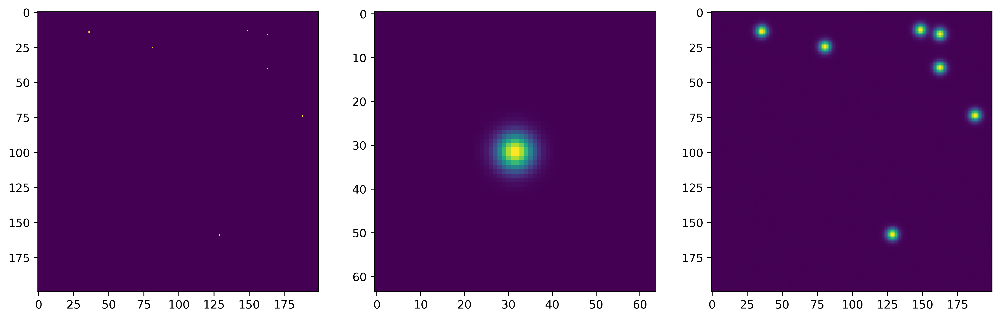

In [5]:
# generate ground truth image, "captured image"

np.random.seed(0)

# we're guessing this value
defocus = WAVELENGTH * 2


image = torch.tensor(
    np.random.choice(
        [0, 1],
        size=(IMAGE_SIZE, IMAGE_SIZE),
        p=[1 - EMITTER_DENSITY, EMITTER_DENSITY],
    )
).float()

psf = (
    torch.nn.functional.conv2d(
        microscope_psf(defocus, KERNEL_SIZE).unsqueeze(0).unsqueeze(0),
        laser_psf(defocus, KERNEL_SIZE).unsqueeze(0).unsqueeze(0),
        padding="same",
    )
    .squeeze(0)
    .squeeze(0)
)

captured_image = torch.nn.functional.conv2d(
    image.unsqueeze(0).unsqueeze(0), psf.unsqueeze(0).unsqueeze(0), padding="same"
).squeeze(0).squeeze(0) + NOISE * np.random.uniform(0, 1, size=(IMAGE_SIZE, IMAGE_SIZE))

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(image)
plt.subplot(1, 3, 2)
plt.imshow(psf)
plt.subplot(1, 3, 3)
plt.imshow(captured_image)

In [6]:
# ### DISCRETIZATION OF GROUND TRUTH IMAGE TO SIMULATE LINEAR TILT CONTINUOUS PSF
# ### NO OVERLAPPING GRID

# # generate ground truth image, "captured image"

# np.random.seed(0)

# # we're guessing this value
# defocus = WAVELENGTH * 2


# image = torch.tensor(
#     np.random.choice(
#         [0, 1],
#         size=(IMAGE_SIZE, IMAGE_SIZE),
#         p=[1 - EMITTER_DENSITY, EMITTER_DENSITY],
#     )
# ).float()

# # brute force continuous PSF using grid-wise discretization to model linear tilt of 2D material
# h, w = image.shape
# NUM_GRID_ACROSS = 4
# NUM_GRIDS = NUM_GRID_ACROSS * NUM_GRID_ACROSS
# GRID_SIZE = h // NUM_GRID_ACROSS

# # GRID LABELS/INDICES
# # | 0 | 1 | 2 | 3 |
# # | 4 | 5 | 6 | 7 |
# # | 8 | 9 | 10| 11|
# # | 12| 13| 14| 15|

# # generate list of psf for NUM_GRIDS
# psfs = []
# temp_defocus = defocus
# for i in range(NUM_GRIDS):
#     temp_defocus = temp_defocus * 1.05
#     temp_psf = (
#         torch.nn.functional.conv2d(
#             microscope_psf(temp_defocus, KERNEL_SIZE).unsqueeze(0).unsqueeze(0),
#             laser_psf(temp_defocus, KERNEL_SIZE).unsqueeze(0).unsqueeze(0),
#             padding="same",
#         )
#         .squeeze(0)
#         .squeeze(0)
#     )
#     psfs.append(temp_psf) # store for reference later

# captured_image = torch.tensor(np.zeros_like(image, dtype=float))
# for i in range(NUM_GRID_ACROSS):
#     for j in range(NUM_GRID_ACROSS):
#         start_y = i * GRID_SIZE
#         end_y = (i+1) * GRID_SIZE
#         start_x = j * GRID_SIZE
#         end_x = (j+1) * GRID_SIZE

#         region = image[start_y:end_y, start_x:end_x]
#         psf_index = (i * NUM_GRID_ACROSS) + j
#         cur_psf = psfs[psf_index]
#         c_region = torch.nn.functional.conv2d(
#                     region.unsqueeze(0).unsqueeze(0), cur_psf.unsqueeze(0).unsqueeze(0), padding="same"
#                     ).squeeze(0).squeeze(0) + NOISE * np.random.uniform(0, 1, size=(GRID_SIZE, GRID_SIZE))
        
#         captured_image[start_y:end_y, start_x:end_x] = c_region

# plt.figure(figsize=(15, 5))
# plt.subplot(2, 3, 1)
# plt.title('Ground Truth Image')
# plt.imshow(image)
# plt.subplot(2, 3, 2)
# plt.title('PSF 0')
# plt.imshow(psfs[0])
# plt.subplot(2, 3, 3)
# plt.title('PSF 1')
# plt.imshow(psfs[1])
# plt.subplot(2, 3, 4)
# plt.title('PSF 2')
# plt.imshow(psfs[2])
# plt.subplot(2, 3, 5)
# plt.title('PSF 3')
# plt.imshow(psfs[3])
# plt.subplot(2, 3, 6)
# plt.title('Noisy Measurement Image') # with Linear Tilt on Continuous PSF
# plt.imshow(captured_image)
# plt.tight_layout()

/var/folders/rd/3pvt7_rx56z6ks1w48j2blc80000gn/T/ipykernel_6473/1161854432.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(scope.get_psf(defocus))[a : a + size, a : a + size]


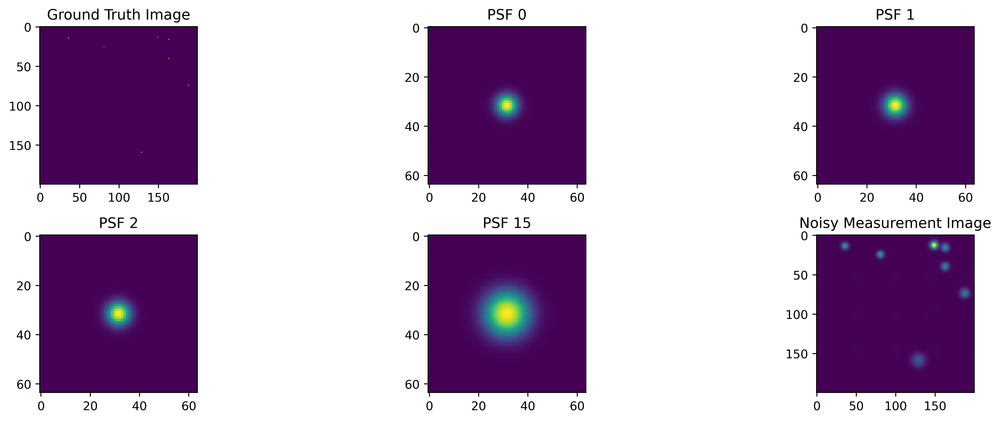

In [7]:
### DISCRETIZATION OF GROUND TRUTH IMAGE TO SIMULATE LINEAR TILT CONTINUOUS PSF
### OVERLAPPING GRID

# generate ground truth image, "captured image"

np.random.seed(0)

# we're guessing this value
defocus = WAVELENGTH * 2


image = torch.tensor(
    np.random.choice(
        [0, 1],
        size=(IMAGE_SIZE, IMAGE_SIZE),
        p=[1 - EMITTER_DENSITY, EMITTER_DENSITY],
    )
).float()

# brute force continuous PSF using grid-wise discretization to model linear tilt of 2D material
h, w = image.shape
NUM_GRID_ACROSS = 4
OVERLAP = 0.25
NUM_GRIDS = NUM_GRID_ACROSS * NUM_GRID_ACROSS
GRID_SIZE = h // NUM_GRID_ACROSS
GRID_SIZE_OVERLAP = int((h // NUM_GRID_ACROSS) * (1 + OVERLAP))
GRID_OVERLAP = (GRID_SIZE_OVERLAP - GRID_SIZE) // 2

def find_region(i, j):
    # overlapping grids in y direction by OVERLAP percent size of GRID_SIZE
    if i == 0:
        start_y = i * GRID_SIZE
        end_y = ((i+1) * GRID_SIZE) + (GRID_OVERLAP * 2)
    elif i == (NUM_GRID_ACROSS-1):
        start_y = (i * GRID_SIZE) - (GRID_OVERLAP * 2)
        end_y = (i+1) * GRID_SIZE
    else:
        start_y = (i * GRID_SIZE) - GRID_OVERLAP
        end_y = ((i+1) * GRID_SIZE) + GRID_OVERLAP

    # overlapping grids in x direction by OVERLAP percent size of GRID_SIZE
    if j == 0:
        start_x = j * GRID_SIZE
        end_x = ((j+1) * GRID_SIZE) + (GRID_OVERLAP * 2)
    elif j == (NUM_GRID_ACROSS-1):
        start_x = (j * GRID_SIZE) - (GRID_OVERLAP * 2)
        end_x = (j+1) * GRID_SIZE
    else:
        start_x = (j * GRID_SIZE) - GRID_OVERLAP
        end_x = ((j+1) * GRID_SIZE) + GRID_OVERLAP
    
    return start_x, end_x, start_y, end_y

# GRID LABELS/INDICES
# | 0 | 1 | 2 | 3 |
# | 4 | 5 | 6 | 7 |
# | 8 | 9 | 10| 11|
# | 12| 13| 14| 15|

# generate list of psf for NUM_GRIDS
psfs = []
temp_defocus = defocus
for i in range(NUM_GRIDS):
    temp_defocus = temp_defocus * 1.05
    temp_psf = (
        torch.nn.functional.conv2d(
            microscope_psf(temp_defocus, KERNEL_SIZE).unsqueeze(0).unsqueeze(0),
            laser_psf(temp_defocus, KERNEL_SIZE).unsqueeze(0).unsqueeze(0),
            padding="same",
        )
        .squeeze(0)
        .squeeze(0)
    )
    psfs.append(temp_psf) # store for reference later

captured_image = torch.tensor(np.zeros_like(image, dtype=float))
for i in range(NUM_GRID_ACROSS):
    for j in range(NUM_GRID_ACROSS):

        start_x, end_x, start_y, end_y = find_region(i, j)

        region = image[start_y:end_y, start_x:end_x]
        psf_index = (i * NUM_GRID_ACROSS) + j
        cur_psf = psfs[psf_index]
        c_region = torch.nn.functional.conv2d(
                    region.unsqueeze(0).unsqueeze(0), cur_psf.unsqueeze(0).unsqueeze(0), padding="same"
                    ).squeeze(0).squeeze(0) + NOISE * np.random.uniform(0, 1, size=(GRID_SIZE_OVERLAP, GRID_SIZE_OVERLAP))
        
        captured_image[start_y:end_y, start_x:end_x] = np.add(captured_image[start_y:end_y, start_x:end_x],c_region)

plt.figure(figsize=(15, 5))
plt.subplot(2, 3, 1)
plt.title('Ground Truth Image')
plt.imshow(image)
plt.subplot(2, 3, 2)
plt.title('PSF 0')
plt.imshow(psfs[0])
plt.subplot(2, 3, 3)
plt.title('PSF 1')
plt.imshow(psfs[1])
plt.subplot(2, 3, 4)
plt.title('PSF 2')
plt.imshow(psfs[2])
plt.subplot(2, 3, 5)
plt.title(f'PSF {len(psfs)-1}')
plt.imshow(psfs[-1])
plt.subplot(2, 3, 6)
plt.title('Noisy Measurement Image') # with Linear Tilt on Continuous PSF
plt.imshow(captured_image)
plt.tight_layout()

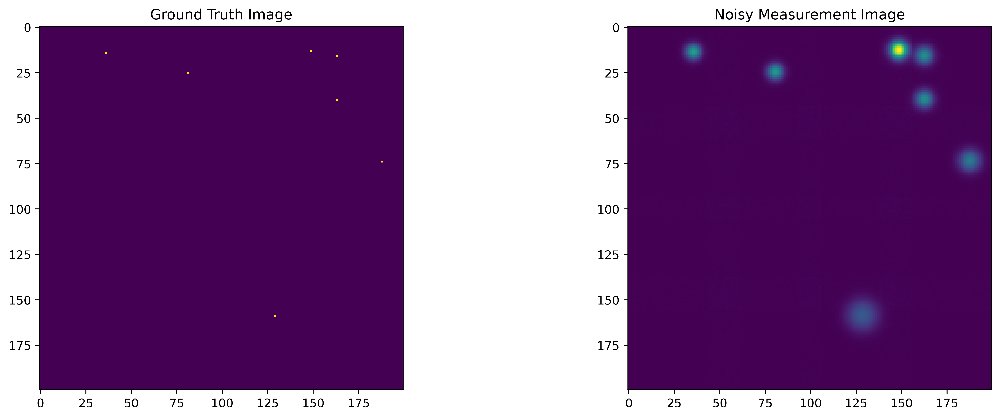

In [8]:
# direct comparison ground truth image & noisy measurement image with continuous PSF brute force
# to model linear 2D tilt of continuous PSF

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.title('Ground Truth Image')
plt.imshow(image)
plt.subplot(1, 2, 2)
plt.title('Noisy Measurement Image') # with Linear Tilt on Continuous PSF
plt.imshow(captured_image)
plt.tight_layout()

In [9]:
# all resulting PSF

num_psfs = len(psfs)
rows_p = int(math.ceil(num_psfs / 3))
fig, axs = plt.subplots(rows_p, 3, figsize=(15,15))
for i in range(1,num_psfs+1):
    plt.subplot(rows_p, 3, i)
    plt.title(f'PSF {i-1}')
    plt.imshow(psfs[i-1])
plt.tight_layout()

0: tensor(842)
1: tensor(1587)
2: tensor(861)
3: tensor(817)
4: tensor(242)
5: tensor(112)
6: tensor(61)
7: tensor(1909)
8: tensor(3774)
9: tensor(3730)
10: tensor(3817)
11: tensor(3782)
12: tensor(1046)
13: tensor(1002)
14: tensor(1274)
15: tensor(1240)


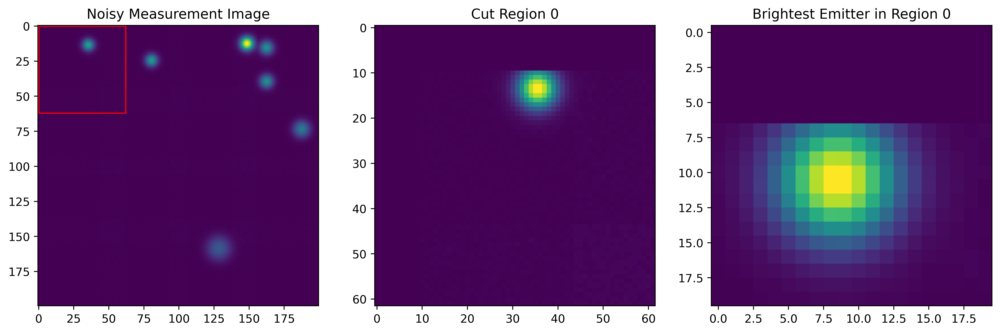

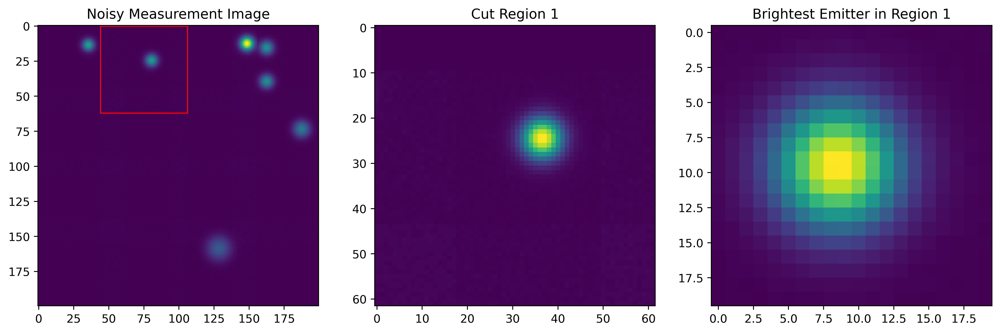

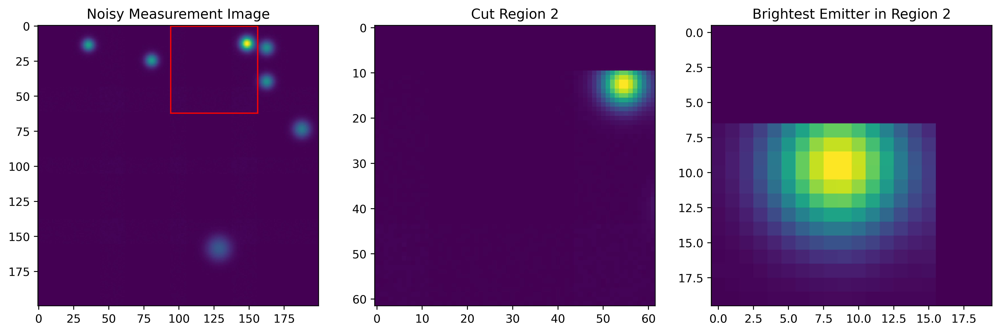

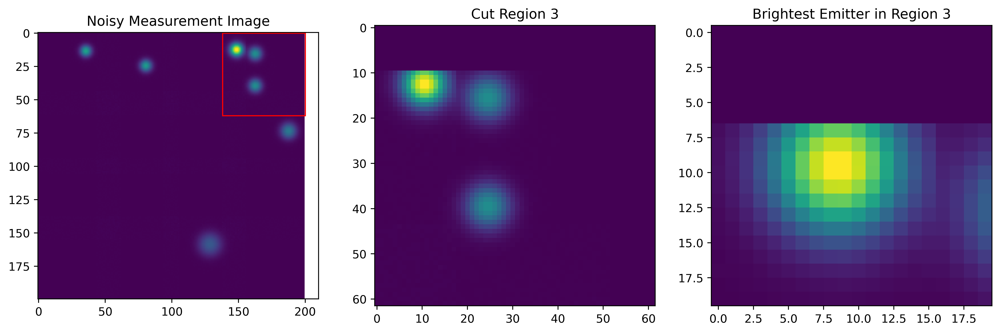

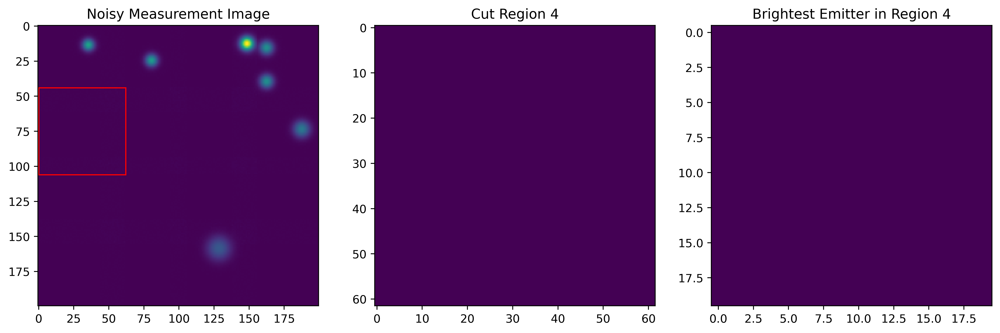

...

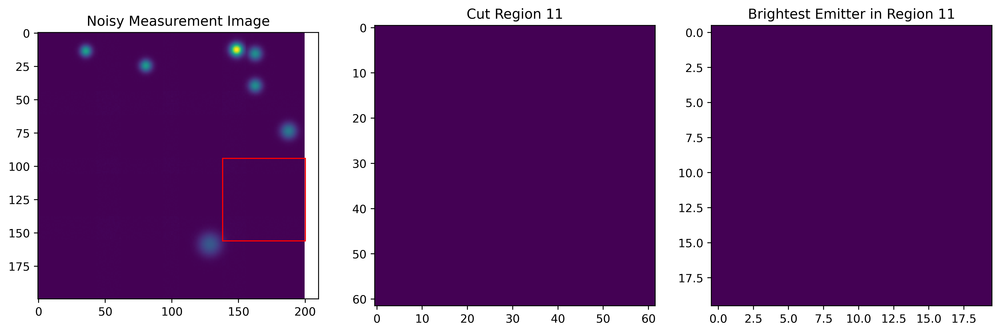

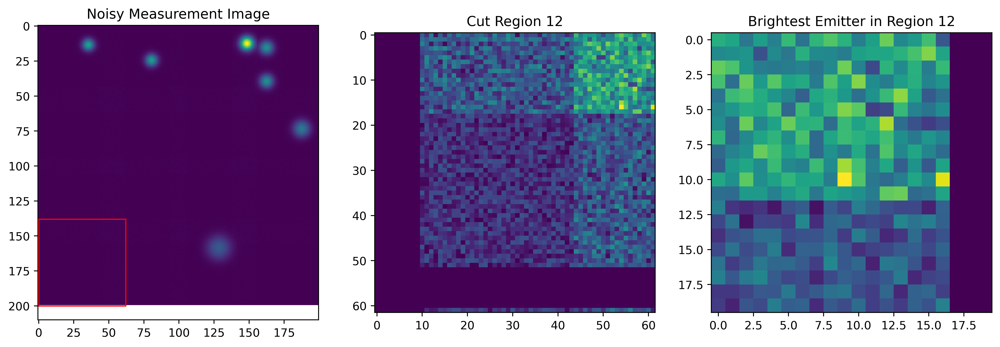

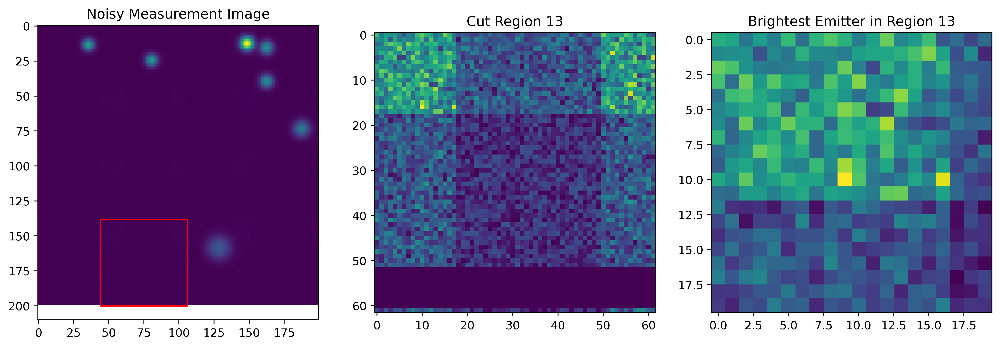

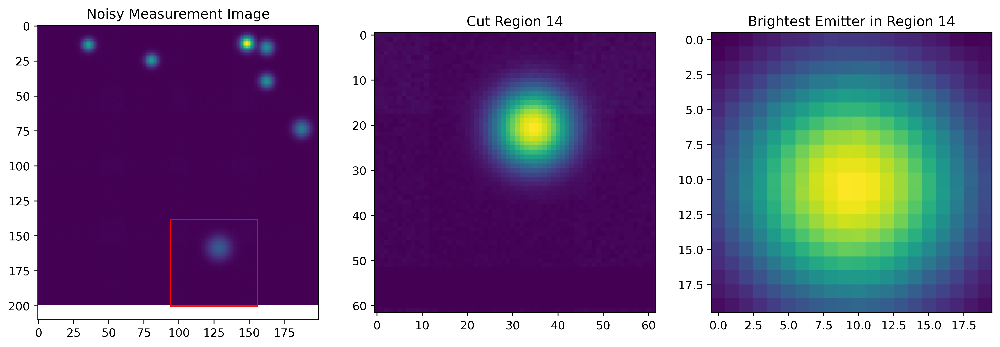

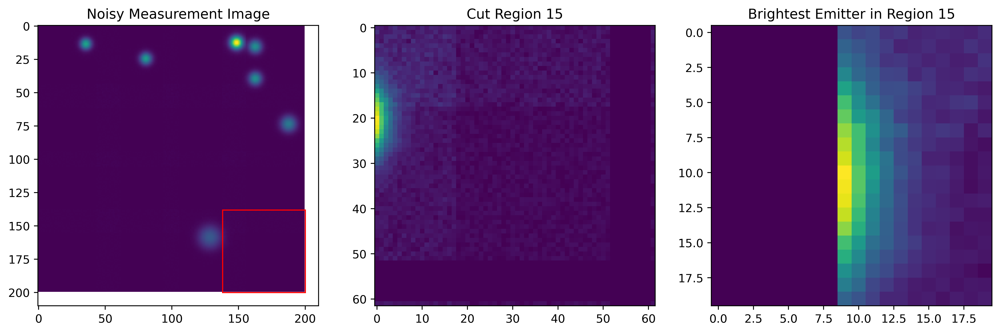

In [10]:
### --- PRETEND WE DONT KNOW ANYTHING --- ###

BOX_SIZE = 10
KERNEL_SIZE2 = BOX_SIZE * 2


def error(img, defocus):
    scope = Microscope(
        dim=KERNEL_SIZE2 * 4,
        NA=NA,
        mag=MAGNIFICATION,
        wavelength=WAVELENGTH,
        pixel_size=PIXEL_SIZE,
        device=torch.device("cpu"),
    )
    a = int(KERNEL_SIZE2 * 1.5)
    psf1 = scope.get_psf(defocus)[a : a + KERNEL_SIZE2, a : a + KERNEL_SIZE2]
    psf2 = laser_psf(defocus, KERNEL_SIZE2)

    #return torch.sqrt(torch.sum((img - psf1) ** 2))
    return torch.abs(img - psf1).mean()

captured_image_cut = torch.clone(captured_image)
captured_image_cut[0:BOX_SIZE, :] = 0
captured_image_cut[-BOX_SIZE:-1, :] = 0
captured_image_cut[:, 0:BOX_SIZE] = 0
captured_image_cut[:, -BOX_SIZE:-1] = 0

## find brightest emitter in all grids
h, w = captured_image_cut.shape
NUM_GRID_ACROSS = 4
OVERLAP = 0.25
NUM_GRIDS = NUM_GRID_ACROSS * NUM_GRID_ACROSS
GRID_SIZE = h // NUM_GRID_ACROSS
GRID_SIZE_OVERLAP = int((h // NUM_GRID_ACROSS) * (1 + OVERLAP))
GRID_OVERLAP = (GRID_SIZE_OVERLAP - GRID_SIZE) // 2

def find_region(i, j):
    # overlapping grids in y direction by OVERLAP percent size of GRID_SIZE
    if i == 0:
        start_y = i * GRID_SIZE
        end_y = ((i+1) * GRID_SIZE) + (GRID_OVERLAP * 2)
    elif i == (NUM_GRID_ACROSS-1):
        start_y = (i * GRID_SIZE) - (GRID_OVERLAP * 2)
        end_y = (i+1) * GRID_SIZE
    else:
        start_y = (i * GRID_SIZE) - GRID_OVERLAP
        end_y = ((i+1) * GRID_SIZE) + GRID_OVERLAP

    # overlapping grids in x direction by OVERLAP percent size of GRID_SIZE
    if j == 0:
        start_x = j * GRID_SIZE
        end_x = ((j+1) * GRID_SIZE) + (GRID_OVERLAP * 2)
    elif j == (NUM_GRID_ACROSS-1):
        start_x = (j * GRID_SIZE) - (GRID_OVERLAP * 2)
        end_x = (j+1) * GRID_SIZE
    else:
        start_x = (j * GRID_SIZE) - GRID_OVERLAP
        end_x = ((j+1) * GRID_SIZE) + GRID_OVERLAP
    
    return start_x, end_x, start_y, end_y

# GRID LABELS/INDICES
# | 0 | 1 | 2 | 3 |
# | 4 | 5 | 6 | 7 |
# | 8 | 9 | 10| 11|
# | 12| 13| 14| 15|

# generate list of captured psfs for NUM_GRIDS (brightest emitters)
captured_psfs = []

for i in range(NUM_GRID_ACROSS):
    for j in range(NUM_GRID_ACROSS):

        start_x, end_x, start_y, end_y = find_region(i, j)

        region = captured_image_cut[start_y:end_y, start_x:end_x]
        region_padded = torch.nn.functional.pad(region, (BOX_SIZE, BOX_SIZE, BOX_SIZE, BOX_SIZE))
        cpsf_index = (i * NUM_GRID_ACROSS) + j

        print(str(cpsf_index) + ': ' + str(torch.argmax(region)))

        if (torch.argmax(region) < 400) or (torch.argmax(region) > 2000):
            region = torch.zeros(region.shape[0], region.shape[1])
            captured_psf = torch.zeros(KERNEL_SIZE2, KERNEL_SIZE2)
            captured_psfs.append(captured_psf)
        else:
            max_i, max_j = torch.unravel_index(torch.argmax(region), region.shape)
            max_i += BOX_SIZE
            max_j += BOX_SIZE
            captured_psf = region_padded[max_i - BOX_SIZE : max_i + BOX_SIZE, max_j - BOX_SIZE + 1 : max_j + BOX_SIZE + 1]
            captured_psfs.append(captured_psf)

        lines = [(start_x, start_y, end_x, start_y),
                 (start_x, start_y, start_x, end_y),
                 (end_x, end_y, end_x, start_y),
                 (end_x, end_y, start_x, end_y)]
        
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.title('Noisy Measurement Image')
        plt.imshow(captured_image)
        for line in lines:
            plt.plot([line[0],line[2]],[line[1], line[3]], color='r', linewidth=1)
        plt.subplot(1, 3, 2)
        plt.title(f'Cut Region {cpsf_index}')
        plt.imshow(region)
        plt.subplot(1, 3, 3)
        plt.title(f'Brightest Emitter in Region {cpsf_index}')
        plt.imshow(captured_psf)
        

# GRID LABELS/INDICES
# | 0 | 1 | 2 | 3 |
# | 4 | 5 | 6 | 7 |
# | 8 | 9 | 10| 11|
# | 12| 13| 14| 15|

psf_grad = torch.func.grad(error, argnums=1)

defocus = 0.0

In [11]:
# plt.figure(figsize=(15, 5))
# plt.subplot(1, 3, 1)
# plt.title('Noisy Measurement Image')
# plt.imshow(captured_image)
# plt.subplot(1, 3, 2)
# plt.title('Cut Noisy Measurement Image')
# plt.imshow(captured_image_cut)
# plt.subplot(1, 3, 3)
# plt.title('Brightest Emitter')
# plt.imshow(captured_psf)

In [12]:
defocus = WAVELENGTH
learning_rate = 1e-13

learned_defocuses = []

# learn PSF for each grid
for i in range(NUM_GRID_ACROSS):
    for j in range(NUM_GRID_ACROSS):
        defocus = WAVELENGTH
        cpsf_index = (i * NUM_GRID_ACROSS) + j
        captured_psf = captured_psfs[cpsf_index]

        if (captured_psf == 0).all():
            defocus = 1
        else:
            for k in range(300):
                loss = error(torch.tensor(captured_psf), defocus)
                grad = psf_grad(torch.tensor(captured_psf), torch.tensor(defocus))
                defocus = defocus - learning_rate * grad
                #print(defocus, loss, grad)
        print('final defocus: ')
        print(defocus)
        learned_defocuses.append(defocus)

#defocus

/var/folders/rd/3pvt7_rx56z6ks1w48j2blc80000gn/T/ipykernel_6473/2452841012.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  loss = error(torch.tensor(captured_psf), defocus)
/var/folders/rd/3pvt7_rx56z6ks1w48j2blc80000gn/T/ipykernel_6473/2452841012.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  grad = psf_grad(torch.tensor(captured_psf), torch.tensor(defocus))
/var/folders/rd/3pvt7_rx56z6ks1w48j2blc80000gn/T/ipykernel_6473/2452841012.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  loss = error(torch.tensor(captured_psf), de

final defocus: 
tensor(5.6540e-07)
final defocus: 
tensor(5.7196e-07)
final defocus: 
tensor(4.5781e-07)
final defocus: 
tensor(4.5799e-07)
final defocus: 
1
final defocus: 
1
final defocus: 
1
final defocus: 
tensor(5.3847e-07)
final defocus: 
1
final defocus: 
1
final defocus: 
1
final defocus: 
1
final defocus: 
tensor(4.2394e-07)
final defocus: 
tensor(4.2432e-07)
final defocus: 
tensor(5.7335e-07)
final defocus: 
tensor(4.6884e-07)


/var/folders/rd/3pvt7_rx56z6ks1w48j2blc80000gn/T/ipykernel_6473/1161854432.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(scope.get_psf(defocus))[a : a + size, a : a + size]
/var/folders/rd/3pvt7_rx56z6ks1w48j2blc80000gn/T/ipykernel_6473/1161854432.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(scope.get_psf(defocus))[a : a + size, a : a + size]


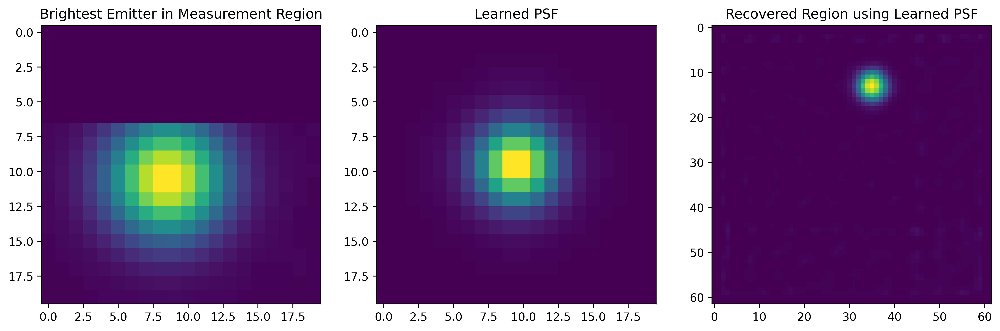

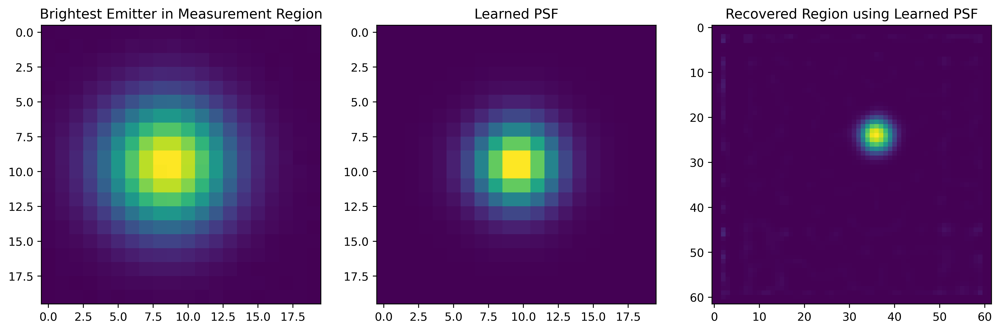

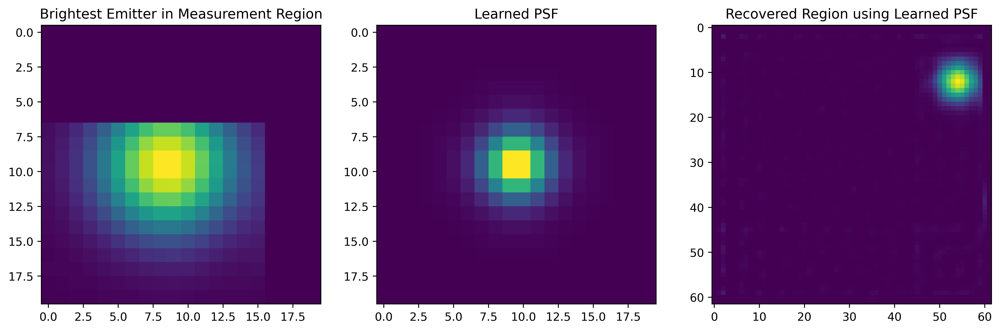

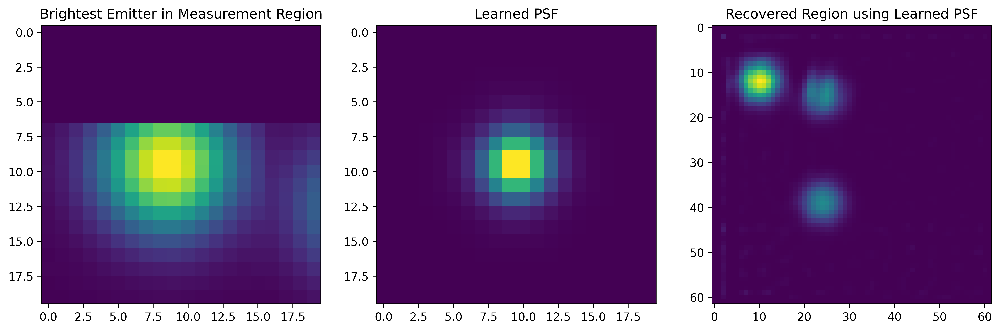

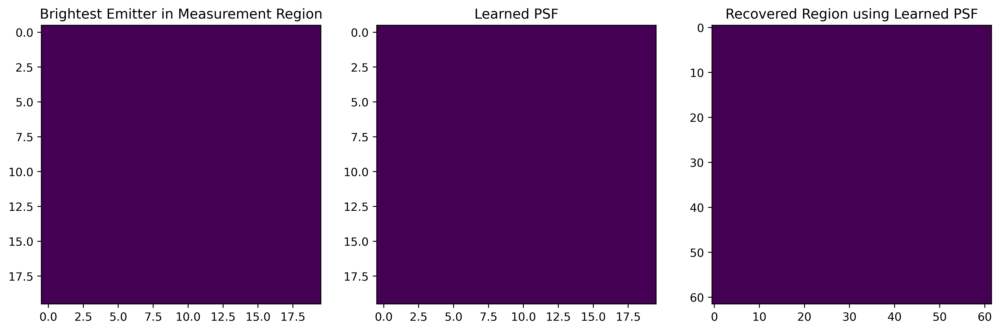

...

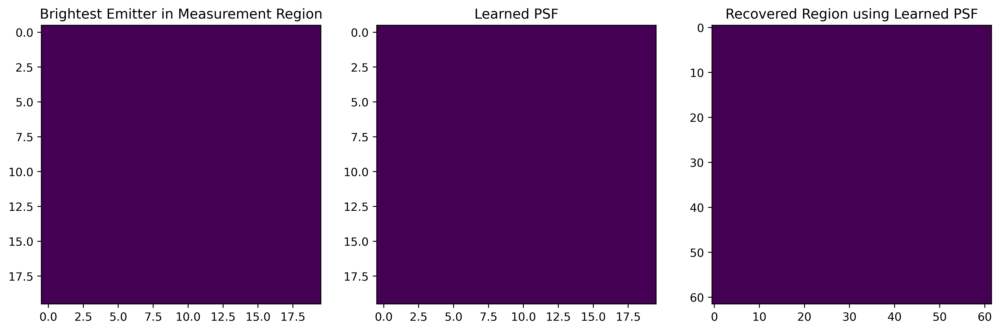

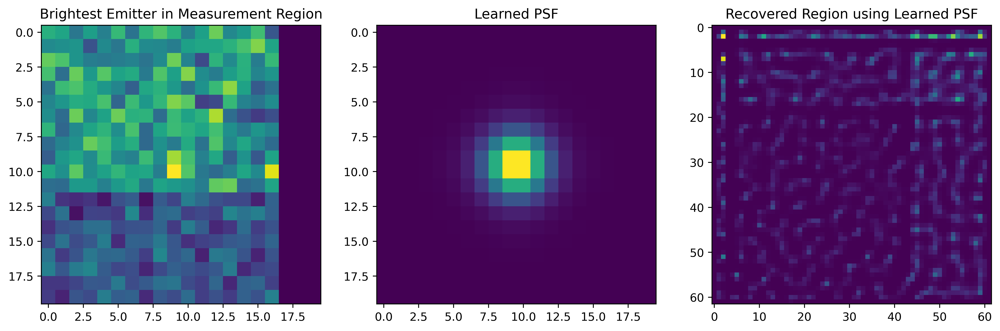

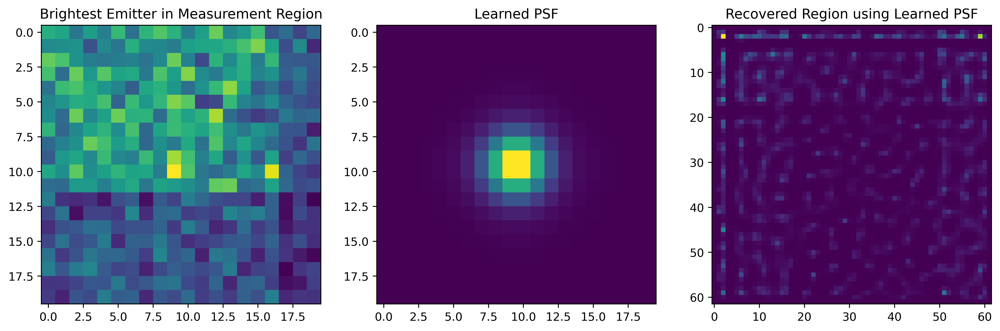

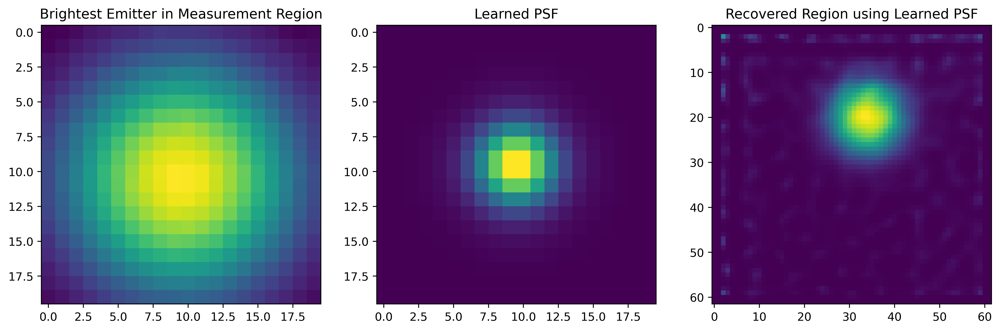

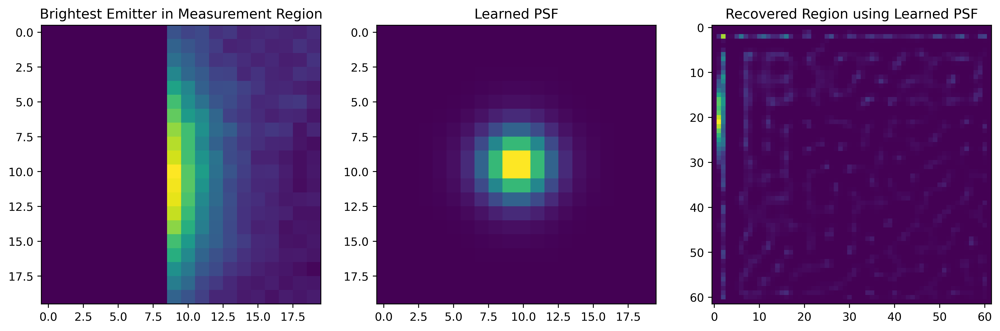

In [13]:
# all recovered PSFs by grid

recovered_psfs = []
recovered_image = torch.tensor(np.zeros_like(image, dtype=float))

for i in range(NUM_GRID_ACROSS):
    for j in range(NUM_GRID_ACROSS):
        rpsf_index = (i * NUM_GRID_ACROSS) + j
        defocus = learned_defocuses[rpsf_index]
        captured_psf = captured_psfs[rpsf_index]
        
        if defocus == 1:
            recovered_psf = torch.zeros(KERNEL_SIZE2, KERNEL_SIZE2)
        else:
            recovered_psf = (torch.nn.functional.conv2d(
                microscope_psf(defocus, KERNEL_SIZE2).unsqueeze(0).unsqueeze(0),
                laser_psf(defocus, KERNEL_SIZE2).unsqueeze(0).unsqueeze(0),
                padding="same",).squeeze(0).squeeze(0)
            )

        start_x, end_x, start_y, end_y = find_region(i, j)

        region = captured_image[start_y:end_y, start_x:end_x]
        r_region = skimage.restoration.richardson_lucy(np.array(region), np.array(recovered_psf), 100)

        recovered_image[start_y:end_y, start_x:end_x] = np.add(recovered_image[start_y:end_y, start_x:end_x],r_region)

        # plot recovered region
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.title('Brightest Emitter in Measurement Region')
        plt.imshow(captured_psf)
        plt.subplot(1, 3, 2)
        plt.title('Learned PSF')
        plt.imshow(recovered_psf)
        plt.subplot(1, 3, 3)
        plt.title('Recovered Region using Learned PSF')
        plt.imshow(r_region)


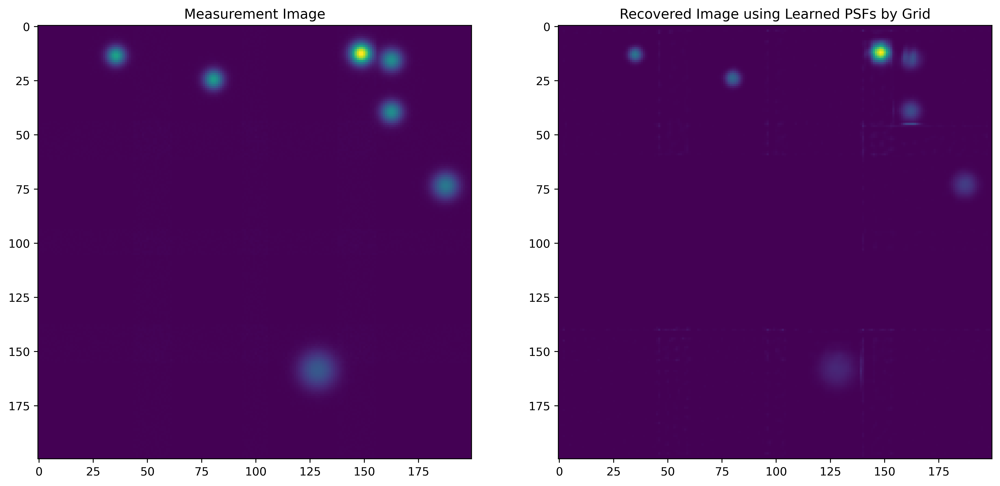

In [14]:
plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
plt.title('Measurement Image')
plt.imshow(captured_image)
plt.subplot(1, 2, 2)
plt.title('Recovered Image using Learned PSFs by Grid')
plt.imshow(recovered_image)